In [ ]:
!nvidia-smi

Fri Oct  8 08:37:50 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.74       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   30C    P8    28W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!pip install transformers==4.7.0

     |████████████████████████████████| 2.5 MB 12.9 MB/s 
     |████████████████████████████████| 895 kB 41.0 MB/s 
     |████████████████████████████████| 3.3 MB 42.1 MB/s 


In [ ]:
!python3 -m pip install -q git+https://github.com/Zhylkaaa/simpletransformers.git@add_losses

     |████████████████████████████████| 270 kB 11.5 MB/s 
     |████████████████████████████████| 43 kB 1.9 MB/s 
     |████████████████████████████████| 1.7 MB 46.2 MB/s 
     |████████████████████████████████| 8.3 MB 40.8 MB/s 
     |████████████████████████████████| 1.2 MB 40.3 MB/s 
     |████████████████████████████████| 180 kB 49.5 MB/s 
     |████████████████████████████████| 139 kB 49.8 MB/s 
     |████████████████████████████████| 97 kB 6.4 MB/s 
     |████████████████████████████████| 63 kB 1.6 MB/s 
     |████████████████████████████████| 243 kB 45.2 MB/s 
     |████████████████████████████████| 125 kB 53.0 MB/s 
     |████████████████████████████████| 1.3 MB 39.2 MB/s 
     |████████████████████████████████| 269 kB 47.4 MB/s 
     |████████████████████████████████| 264 kB 47.3 MB/s 
     |████████████████████████████████| 4.3 MB 37.7 MB/s 
     |████████████████████████████████| 76 kB 4.5 MB/s 
     |████████████████████████████████| 111 kB 51.2 MB/s 
     |████████████████

In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report,f1_score
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
!pip install -q tensorboardX
from simpletransformers.config.model_args import ClassificationArgs
from simpletransformers.classification import ClassificationModel

     |████████████████████████████████| 124 kB 13.3 MB/s 


In [ ]:
url_train = 'https://raw.githubusercontent.com/Navya1618/HopeSpeech/main/english_hope_train.csv'
#url_train = 'https://raw.githubusercontent.com/Navya1618/HopeSpeech/main/aug_english_train.csv?token=APEWX4HMNVYRNF3VJC4SJSDBFRP5W'
#url_train = 'https://raw.githubusercontent.com/Navya1618/HopeSpeech/main/aug4_english_train.csv?token=APEWX4HMNVYRNF3VJC4SJSDBFRP5W'
url_dev = 'https://raw.githubusercontent.com/Navya1618/HopeSpeech/main/english_hope_dev.csv?token=APEWX4CZCHBBMM5IBVDV5H3BEUKRI'
url_test = 'https://raw.githubusercontent.com/Navya1618/HopeSpeech/main/english_hope_test.csv?token=APEWX4EPOUGKMS64MTHB2VDBEUKX6'

train=pd.read_csv(url_train,names=['tweet','hope','un'],sep='\t')
val=pd.read_csv(url_dev,names=['tweet','hope','un'],sep='\t')
test=pd.read_csv(url_test,names=['tweet','hope','un'],sep=';')
train.head()

,tweet,hope,un
0,these tiktoks radiate gay chaotic energy and i...,Non_hope_speech,NaN
1,@Champions Again He got killed for using false...,Non_hope_speech,NaN
2,It's not that all lives don't matter,Non_hope_speech,NaN
3,Is it really that difficult to understand? Bla...,Non_hope_speech,NaN
4,Whenever we say black isn't that racists? Why...,Non_hope_speech,NaN


In [ ]:
train = train.drop(train[train['hope'] == 'label'].index)
train = train.drop(train[train['hope'] == 'not-English'].index)
val = val.drop(val[val['hope'] == 'label'].index)
val = val.drop(val[val['hope'] == 'not-English'].index)
test = test.drop(test[test['hope'] == 'label'].index)
test = test.drop(test[test['hope'] == 'not-English'].index)

In [ ]:
from sklearn.preprocessing import LabelEncoder
import torch
encoder=LabelEncoder()
train_df=pd.DataFrame()
valid_df=pd.DataFrame()
test_df=pd.DataFrame()
train_df['text']=train['tweet']
train_df['text'] = train_df['text'].str.lower()
valid_df['text']=val['tweet']
test_df['text']=test['tweet']
train_df['labels']=encoder.fit_transform(train['hope'])
valid_df['labels']=encoder.fit_transform(val['hope'])
test_df['labels']=encoder.fit_transform(test['hope'])

In [ ]:
model_args = ClassificationArgs(
    num_train_epochs=3,
    overwrite_output_dir=True, 
    manual_seed=42,
    max_seq_length=160,
    #sliding_window=True,
    eval_batch_size=10,
    do_lower_case=True,
    early_stopping_patience=2,
    save_model_every_epoch=False,
    early_stopping_consider_epochs=True,
    use_early_stopping=True,
    evaluate_during_training=False,
    #wandb_project='pytorch',
    learning_rate=3e-05,
    loss_type = 'focal', # or 'dice' or 'tversky'
    loss_args = {
            'alpha': None,
            'gamma': 0,
            'reduction': 'mean',
            'ignore_index': -100,
         }
    )


model = ClassificationModel(
    model_type='bert',
    model_name='bert-base-multilingual-uncased', 
    use_cuda=torch.cuda.is_available(),
    #cuda_device=3,
    num_labels=len(encoder.classes_), 
    args=model_args)


Some weights of the model checkpoint at bert-base-multilingual-uncased were not used when initializing BertForSequenceClassification: ['cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.bias', 'cls.predictions.bias', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model 

In [ ]:
model.train_model(train_df,args={'train_batch_size':32},eval_df=valid_df)

  0%|          | 0/22740 [00:00<?, ?it/s]

Epoch:   0%|          | 0/3 [00:00<?, ?it/s]

Running Epoch 0 of 3:   0%|          | 0/711 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/simpletransformers/classification/classification_model.py:911: FutureWarning: Non-finite norm encountered in torch.nn.utils.clip_grad_norm_; continuing anyway. Note that the default behavior will change in a future release to error out if a non-finite total norm is encountered. At that point, setting error_if_nonfinite=false will be required to retain the old behavior.
  model.parameters(), args.max_grad_norm


Running Epoch 1 of 3:   0%|          | 0/711 [00:00<?, ?it/s]

Running Epoch 2 of 3:   0%|          | 0/711 [00:00<?, ?it/s]

(2133, 0.15933165636576846)

In [ ]:
val_predictions, raw_outputs = model.predict(valid_df['text'].tolist())
print('f1 score:', f1_score(valid_df['labels'], val_predictions,average='macro'))
print('class_report\n',classification_report(valid_df['labels'],val_predictions,target_names=list(["hope", "non-hope"]), digits=4))

  0%|          | 0/2840 [00:00<?, ?it/s]

  0%|          | 0/284 [00:00<?, ?it/s]

f1 score: 0.7895528111826997
class_report
               precision    recall  f1-score   support

        hope     0.6638    0.5756    0.6166       271
    non-hope     0.9559    0.9692    0.9625      2569

    accuracy                         0.9317      2840
   macro avg     0.8098    0.7724    0.7896      2840
weighted avg     0.9280    0.9317    0.9295      2840



In [ ]:
test_predictions, raw_outputs = model.predict(test_df['text'].tolist())
print('f1 score:', f1_score(test_df['labels'], test_predictions,average='macro'))
print('class_report\n',classification_report(test_df['labels'],test_predictions,target_names=list(encoder.classes_), digits=4))

  0%|          | 0/2843 [00:00<?, ?it/s]

  0%|          | 0/285 [00:00<?, ?it/s]

f1 score: 0.7745914686442148
class_report
                  precision    recall  f1-score   support

    Hope_speech     0.6167    0.5600    0.5870       250
Non_hope_speech     0.9580    0.9664    0.9622      2593

       accuracy                         0.9307      2843
      macro avg     0.7873    0.7632    0.7746      2843
   weighted avg     0.9279    0.9307    0.9292      2843



In [ ]:
valid_df['predictions']=val_predictions
valid_df['labels']=encoder.inverse_transform(valid_df['labels'])
valid_df['predictions']=encoder.inverse_transform(valid_df['predictions'])

In [ ]:
test_df['predictions']=test_predictions
test_df['labels']=encoder.inverse_transform(test_df['labels'])
test_df['predictions']=encoder.inverse_transform(test_df['predictions'])

In [ ]:
right=valid_df[valid_df['predictions']==valid_df['labels']]

right2=test_df[test_df['predictions']==test_df['labels']]

In [ ]:
right

,text,labels,predictions
0,Thats it.... like....I dont like that statue,Non_hope_speech,Non_hope_speech
1,@Generation X Counting money that she been giv...,Non_hope_speech,Non_hope_speech
2,@Paola Hernandez i never said to be intolerant...,Non_hope_speech,Non_hope_speech
3,@Firstlast300 Wow An opinion is that I don't l...,Non_hope_speech,Non_hope_speech
4,WOW!!!!!!!That was so so inspiring and incredi...,Hope_speech,Hope_speech
...,...,...,...
2836,TheLegend27 Is Alive she is literally a boy lol,Non_hope_speech,Non_hope_speech
2837,Such fake sentiment. .,Non_hope_speech,Non_hope_speech
2838,@A G black lives arent undervalued compared to...,Non_hope_speech,Non_hope_speech
2839,People who pulled it down can and will be arre...,Non_hope_speech,Non_hope_speech


In [ ]:
true_pos = len(right[right['labels']=='Hope_speech'])
true_neg = len(right[right['labels']=='Non_hope_speech'])
false_pos = 271-true_pos
false_neg = 2569-true_neg
print(true_pos,true_neg,false_pos,false_neg)

156 2490 115 79


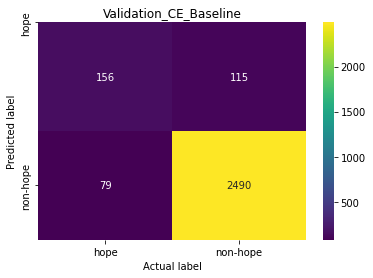

In [ ]:
import seaborn as sn
confusion_matrix = np.array([[true_pos, false_pos], [false_neg, true_neg]])

sn.heatmap(confusion_matrix,annot=True, cmap="viridis" ,fmt='g')
plt.xticks([0.5,1.5],labels=['hope', 'non-hope'])
plt.yticks([0,1.5],labels=['hope', 'non-hope'])
plt.title('Validation_CE_Baseline')
plt.xlabel('Actual label')
plt.ylabel('Predicted label');

In [ ]:
true_pos = len(right2[right2['labels']=='Hope_speech'])
true_neg = len(right2[right2['labels']=='Non_hope_speech'])
false_pos = 271-true_pos
false_neg = 2569-true_neg
print(true_pos,true_neg,false_pos,false_neg)

140 2506 131 63


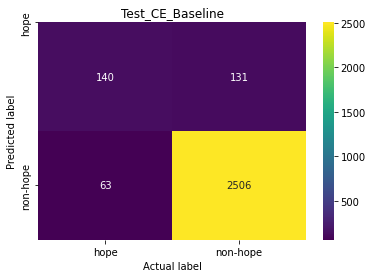

In [ ]:
import seaborn as sn
confusion_matrix = np.array([[true_pos, false_pos], [false_neg, true_neg]])

sn.heatmap(confusion_matrix,annot=True, cmap="viridis" ,fmt='g')
plt.xticks([0.5,1.5],labels=['hope', 'non-hope'])
plt.yticks([0,1.5],labels=['hope', 'non-hope'])
plt.title('Test_CE_Baseline')
plt.xlabel('Actual label')
plt.ylabel('Predicted label');

In [ ]:
wrong=valid_df[valid_df['predictions']!=valid_df['labels']]
wrong2=test_df[test_df['predictions']!=test_df['labels']]

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
right.to_csv('/content/drive/MyDrive/Hope/rightbaseline_val.csv')
right2.to_csv('/content/drive/MyDrive/Hope/rightbaseline_test.csv')

In [ ]:
wrong.to_csv('/content/drive/MyDrive/Hope/wrongbaseline_val.csv')
wrong2.to_csv('/content/drive/MyDrive/Hope/wrongbaseline_test.csv')

Here


In [ ]:
url_right_focal = '/content/drive/MyDrive/Hope/right1_val.csv'
right=pd.read_csv(url_right_focal,names=['tweet','hope','pred'],sep=',')
right.head()

,tweet,hope,pred
NaN,text,labels,predictions
0.0,Thats it.... like....I dont like that statue,Non_hope_speech,Non_hope_speech
1.0,@Generation X Counting money that she been giv...,Non_hope_speech,Non_hope_speech
2.0,@Paola Hernandez i never said to be intolerant...,Non_hope_speech,Non_hope_speech
3.0,@Firstlast300 Wow An opinion is that I don't l...,Non_hope_speech,Non_hope_speech


In [ ]:
true_pos = len(right[right['hope']=='Hope_speech'])
true_neg = len(right[right['hope']=='Non_hope_speech'])
false_pos = 271-true_pos
false_neg = 2569-true_neg
print(true_pos,true_neg,false_pos,false_neg)

138 2495 133 74


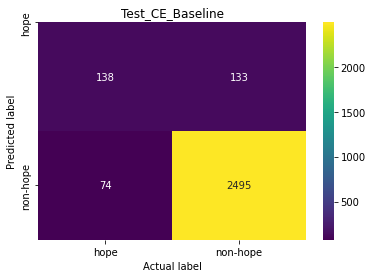

In [ ]:
import seaborn as sn
confusion_matrix = np.array([[true_pos, false_pos], [false_neg, true_neg]])

sn.heatmap(confusion_matrix,annot=True, cmap="viridis" ,fmt='g')
plt.xticks([0.5,1.5],labels=['hope', 'non-hope'])
plt.yticks([0,1.5],labels=['hope', 'non-hope'])
plt.title('Test_CE_Baseline')
plt.xlabel('Actual label')
plt.ylabel('Predicted label');

In [ ]:
url_right_focal = '/content/drive/MyDrive/Hope/right3_test.csv'
right2=pd.read_csv(url_right_focal,names=['tweet','hope','pred'],sep=',')
right2.head()

,tweet,hope,pred
NaN,text,labels,predictions
1.0,What do you mean by the word sniped?,Non_hope_speech,Non_hope_speech
2.0,I love this video!! I’m bisexual and it’s just...,Hope_speech,Hope_speech
3.0,ya the irony but then i don't want to come off...,Non_hope_speech,Non_hope_speech
4.0,A PERSON'S CHARACTER MATTERS. PERIOD!!,Non_hope_speech,Non_hope_speech


In [ ]:
true_pos = len(right[right['hope']=='Hope_speech'])
true_neg = len(right[right['hope']=='Non_hope_speech'])
false_pos = 271-true_pos
false_neg = 2569-true_neg
print(true_pos,true_neg,false_pos,false_neg)

138 2495 133 74


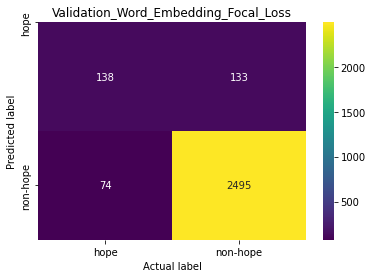

In [ ]:
import seaborn as sn
confusion_matrix = np.array([[true_pos, false_pos], [false_neg, true_neg]])

sn.heatmap(confusion_matrix,annot=True, cmap="viridis" ,fmt='g')
plt.xticks([0.5,1.5],labels=['hope', 'non-hope'])
plt.yticks([0,1.5],labels=['hope', 'non-hope'])
plt.title('Validation_Word_Embedding_Focal_Loss')
plt.xlabel('Actual label')
plt.ylabel('Predicted label');

In [ ]:
url_right_focal = '/content/drive/MyDrive/Hope/right1_test.csv'
right2=pd.read_csv(url_right_focal,names=['tweet','hope','pred'],sep=',')
right2.head()

,tweet,hope,pred
NaN,text,labels,predictions
1.0,What do you mean by the word sniped?,Non_hope_speech,Non_hope_speech
2.0,I love this video!! I’m bisexual and it’s just...,Hope_speech,Hope_speech
3.0,ya the irony but then i don't want to come off...,Non_hope_speech,Non_hope_speech
4.0,A PERSON'S CHARACTER MATTERS. PERIOD!!,Non_hope_speech,Non_hope_speech


In [ ]:
true_pos = len(right2[right2['hope']=='Hope_speech'])
true_neg = len(right2[right2['hope']=='Non_hope_speech'])
false_pos = 271-true_pos
false_neg = 2569-true_neg
print(true_pos,true_neg,false_pos,false_neg)

110 2515 161 54


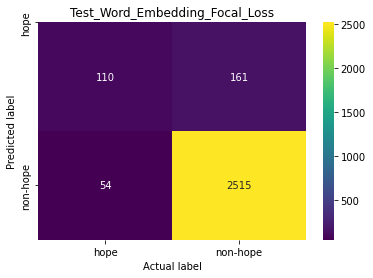

In [ ]:
import seaborn as sn
confusion_matrix = np.array([[true_pos, false_pos], [false_neg, true_neg]])

sn.heatmap(confusion_matrix,annot=True, cmap="viridis" ,fmt='g')
plt.xticks([0.5,1.5],labels=['hope', 'non-hope'])
plt.yticks([0,1.5],labels=['hope', 'non-hope'])
plt.title('Test_Word_Embedding_Focal_Loss')
plt.xlabel('Actual label')
plt.ylabel('Predicted label');

In [ ]:
!pip install -q lime
import numpy as np
from lime.lime_text import LimeTextExplainer
explainer = LimeTextExplainer(class_names=list(encoder.classes_))
def softmax(x):
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum(axis=0)

# define prediction function
def predict_probs(texts):
    predictions = model.predict(texts)
    x = np.array(list(predictions)[1])
    return np.apply_along_axis(softmax, 1, x)

# explain instance with LIME
#exp = explainer.explain_instance(valid_df['text'][10], predict_probs, num_features=6)

     |████████████████████████████████| 275 kB 12.4 MB/s 
ERROR: Operation cancelled by user
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/pip/_internal/cli/base_command.py", line 180, in _main
    status = self.run(options, args)
  File "/usr/local/lib/python3.7/dist-packages/pip/_internal/cli/req_command.py", line 199, in wrapper
    return func(self, options, args)
  File "/usr/local/lib/python3.7/dist-packages/pip/_internal/commands/install.py", line 319, in run
    reqs, check_supported_wheels=not options.target_dir
  File "/usr/local/lib/python3.7/dist-packages/pip/_internal/resolution/resolvelib/resolver.py", line 128, in resolve
    requirements, max_rounds=try_to_avoid_resolution_too_deep
  File "/usr/local/lib/python3.7/dist-packages/pip/_vendor/resolvelib/resolvers.py", line 473, in resolve
    state = resolution.resolve(requirements, max_rounds=max_rounds)
  File "/usr/local/lib/python3.7/dist-packages/pip/_vendor/resolvelib/resolvers.py"

ModuleNotFoundError: ignored

In [ ]:
def explain(text):
  exp = explainer.explain_instance(text, predict_probs, num_features=6)
  return exp.show_in_notebook()

In [ ]:
explain("WOW!!!!!!!That was so so inspiring and incredible!!! THis speech has just saved my day")

  0%|          | 0/5000 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

In [ ]:
explain("I'm still hiding my gender to my parents and they don't know I'm dating someone. My friends knows already about my gender and they are very supportive of it. And I'm very thankful to find true friends like them")

  0%|          | 0/5000 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

In [ ]:
explain("[""I still hide my gender from my parents and they don't know I'm dating anyone. My friends already know my gender and are very supportive. And I am very grateful to find true friends like them.""]")

  0%|          | 0/5000 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

In [ ]:
for i in range(5):
  explain(wrong_list[i])

  0%|          | 0/5000 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/5000 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/5000 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/5000 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/5000 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

In [ ]:
!mkdir -p saved_model
model.save('saved_model/model1')

AttributeError: ignored

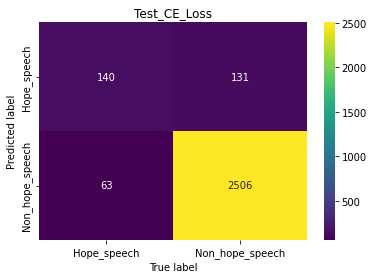

In [ ]:
import seaborn as sn
import numpy as np
import matplotlib.pyplot as plt

#confusion_matrix = np.array([[true_pos, false_pos], [false_neg, true_neg]])
confusion_matrix = np.array([[140 , 131], [63, 2506]])

sn.heatmap(confusion_matrix,annot=True, cmap="viridis" ,fmt='g')
plt.xticks([0.5,1.5],labels=['Hope_speech', 'Non_hope_speech'])
plt.yticks([0.5,1.5],labels=['Hope_speech', 'Non_hope_speech'])
plt.title('Test_CE_Loss')
plt.xlabel('True label')
plt.ylabel('Predicted label');